In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])



# Load dataset of the CIFAR-10
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False, num_workers=2)



# cnn model
class LappedTransformCNN(nn.Module):
    def __init__(self):
        super(LappedTransformCNN, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=24, kernel_size=16, stride=8, padding=0, bias=False)
        self.conv2 = nn.ConvTranspose2d(in_channels=24, out_channels=3, kernel_size=16, stride=8, padding=0, bias=False)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return x


model = LappedTransformCNN()

criterion = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training of the model
num_epochs = 10

for epoch in range(num_epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, _ = data

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if i % 100 == 99:
            print(f"[{epoch + 1}, {i + 1}] loss: {running_loss / 100:.3f}")
            running_loss = 0.0

print('Finished Training')



# Evaluating the model
model.eval()
total_loss = 0.0
with torch.no_grad():
    for data in testloader:
        inputs, _ = data
        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        total_loss += loss.item()

print(f'Average test loss: {total_loss / len(testloader):.3f}')


torch.save(model.state_dict(), 'lapped_transform_cnn.pth')


Files already downloaded and verified
Files already downloaded and verified
[1, 100] loss: 0.111
[1, 200] loss: 0.072
[1, 300] loss: 0.065
[2, 100] loss: 0.060
[2, 200] loss: 0.060
[2, 300] loss: 0.059
[3, 100] loss: 0.058
[3, 200] loss: 0.058
[3, 300] loss: 0.058
[4, 100] loss: 0.058
[4, 200] loss: 0.058
[4, 300] loss: 0.057
[5, 100] loss: 0.058
[5, 200] loss: 0.058
[5, 300] loss: 0.058
[6, 100] loss: 0.057
[6, 200] loss: 0.057
[6, 300] loss: 0.058
[7, 100] loss: 0.057
[7, 200] loss: 0.057
[7, 300] loss: 0.058
[8, 100] loss: 0.057
[8, 200] loss: 0.057
[8, 300] loss: 0.057
[9, 100] loss: 0.057
[9, 200] loss: 0.057
[9, 300] loss: 0.057
[10, 100] loss: 0.057
[10, 200] loss: 0.057
[10, 300] loss: 0.057
Finished Training
Average test loss: 0.057


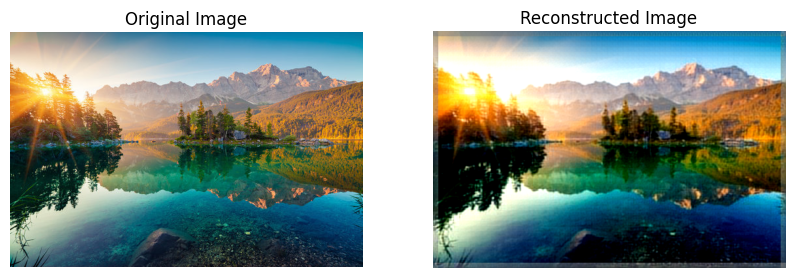

Original image size: 2332800 bytes
Compressed image size: 278784 bytes
Compression ratio: 8.367768595041323


In [15]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

denormalize = transforms.Normalize((-1.0, -1.0, -1.0), (2.0, 2.0, 2.0))

def denormalize_image(tensor):
    return denormalize(tensor)


def quantize(tensor, num_levels):
    min_val = tensor.min()
    max_val = tensor.max()
    scale = (max_val - min_val) / (num_levels - 1)
    quantized = torch.round((tensor - min_val) / scale)
    return quantized, scale, min_val


def dequantize(quantized, scale, min_val):
    dequantized = quantized * scale + min_val
    return dequantized


def compress_image(image, model, num_levels):

    with torch.no_grad():
        transformed_image = model.conv1(image)


    quantized_image, scale, min_val = quantize(transformed_image, num_levels)


    flat_quantized = quantized_image.flatten().cpu().numpy()
    byte_stream = flat_quantized.tobytes()
    return byte_stream, quantized_image.shape, scale, min_val



def decompress_image(byte_stream, shape, scale, min_val, model):

    flat_quantized = np.frombuffer(byte_stream, dtype=np.float32)
    quantized_image = torch.tensor(flat_quantized).view(shape).to(model.conv1.weight.device)


    dequantized_image = dequantize(quantized_image, scale, min_val)



    with torch.no_grad():
        dequantized_image = model.conv2(dequantized_image)


    return dequantized_image



image = Image.open('/content/360_F_270350073_WO6yQAdptEnAhYKM5GuA9035wbRnVJSr.jpg')



example_image = transforms.ToTensor()(image).unsqueeze(0)
example_image = (example_image - 0.5) / 0.5



compressed_byte_stream, shape, scale, min_val = compress_image(example_image, model, num_levels=256)
reconstructed_image = decompress_image(compressed_byte_stream, shape, scale, min_val, model=model)


original_image_np = denormalize_image(example_image).squeeze().permute(1, 2, 0).cpu().numpy()
reconstructed_image_np = denormalize_image(reconstructed_image).squeeze().permute(1, 2, 0).cpu().numpy()



original_image_np = np.clip(original_image_np, 0, 1)
reconstructed_image_np = np.clip(reconstructed_image_np, 0, 1)


original_image_pil = Image.fromarray((original_image_np * 255).astype(np.uint8))
reconstructed_image_pil = Image.fromarray((reconstructed_image_np * 255).astype(np.uint8))

original_image_pil.save('original_image.png')
reconstructed_image_pil.save('reconstructed_image.png')



plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image_np)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Reconstructed Image')
plt.imshow(reconstructed_image_np)
plt.axis('off')

plt.show()


original_image_size = example_image.nelement() * example_image.element_size()
compressed_image_size = len(compressed_byte_stream)
compression_ratio = original_image_size / compressed_image_size

print(f'Original image size: {original_image_size} bytes')
print(f'Compressed image size: {compressed_image_size} bytes')
print(f'Compression ratio: {compression_ratio}')

In [16]:
!pip install torch torchvision numpy

In [17]:
!git clone https://github.com/richzhang/PerceptualSimilarity.git
%cd PerceptualSimilarity
!pip install -r requirements.txt

fatal: destination path 'PerceptualSimilarity' already exists and is not an empty directory.
/content/PerceptualSimilarity


In [18]:
!pip install lpips

import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from lpips import LPIPS
from torch.nn import functional as F


lpips = LPIPS(net='alex').cuda()

def calculate_lpips_loss(image1, image2):
    image1 = image1.unsqueeze(0).cuda()
    image2 = image2.unsqueeze(0).cuda()
    return lpips(image1, image2).item()


def convert_tensor_for_lpips(tensor):
    return tensor * 2 - 1


def image_to_tensor(image_np):
    return torch.tensor(image_np, dtype=torch.float32).permute(2, 0, 1) / 255.0


original_image_tensor = image_to_tensor(original_image_np)
reconstructed_image_tensor = image_to_tensor(reconstructed_image_np)


reconstructed_image_tensor_resized = F.interpolate(reconstructed_image_tensor.unsqueeze(0),
                                                  size=original_image_tensor.shape[1:],
                                                  mode='bilinear', align_corners=False).squeeze(0)


lpips_value = calculate_lpips_loss(convert_tensor_for_lpips(original_image_tensor),convert_tensor_for_lpips(reconstructed_image_tensor_resized)) # Use the resized image


print(f'LPIPS Loss: {lpips_value}')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /content/PerceptualSimilarity/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
LPIPS Loss: 6.954265700187534e-05


In [19]:
%cd /content/

/content


In [20]:
!git clone https://github.com/Karanraj06/image-compression

fatal: destination path 'image-compression' already exists and is not an empty directory.


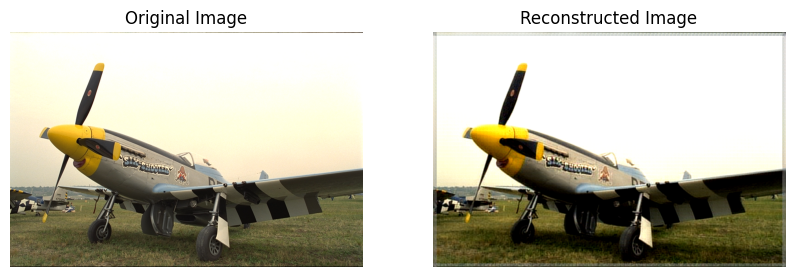

LPIPS Loss: 5.7136341638397425e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


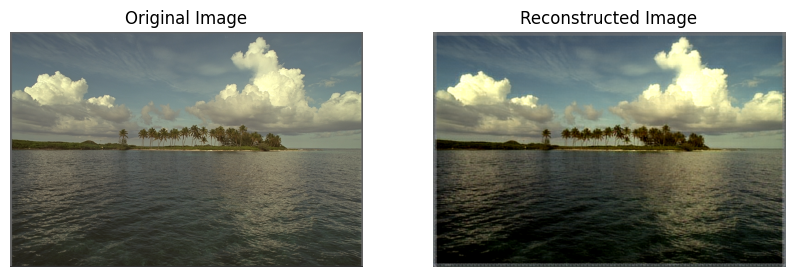

LPIPS Loss: 2.572725497884676e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


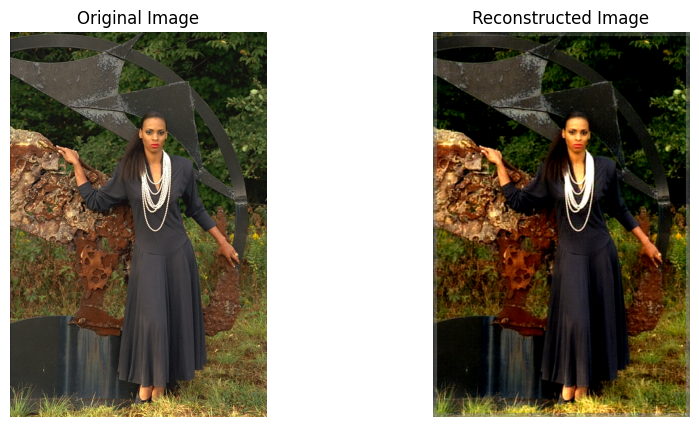

LPIPS Loss: 4.541271846392192e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


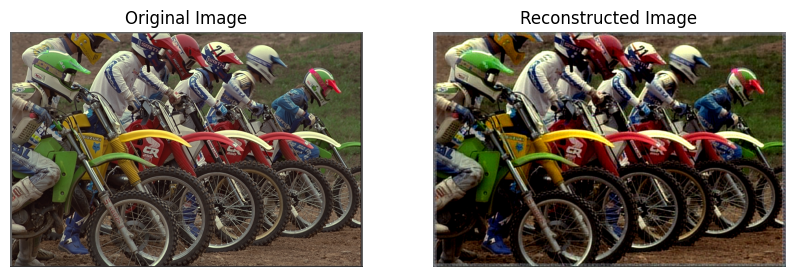

LPIPS Loss: 8.224643534049392e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


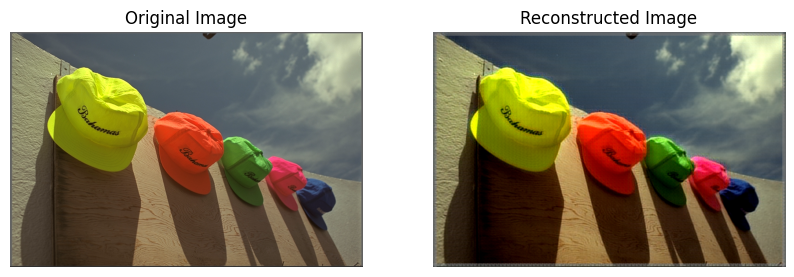

LPIPS Loss: 2.71470271400176e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


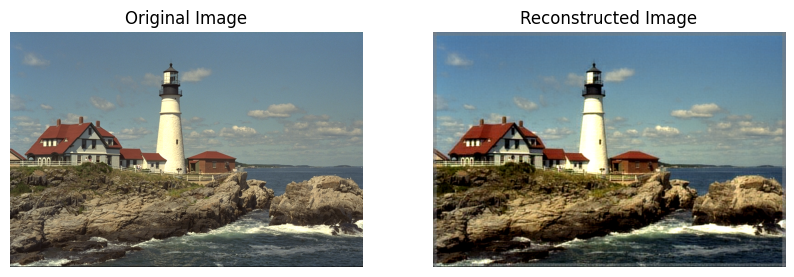

LPIPS Loss: 4.676917160395533e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


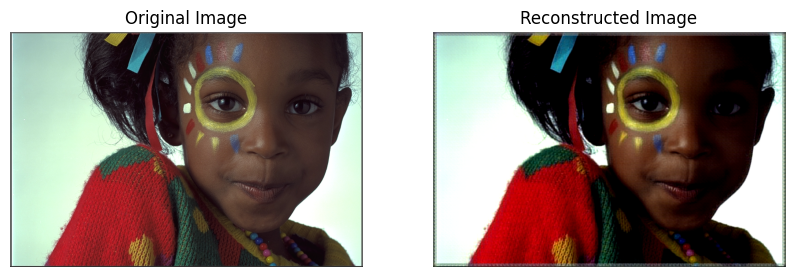

LPIPS Loss: 5.097194298286922e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


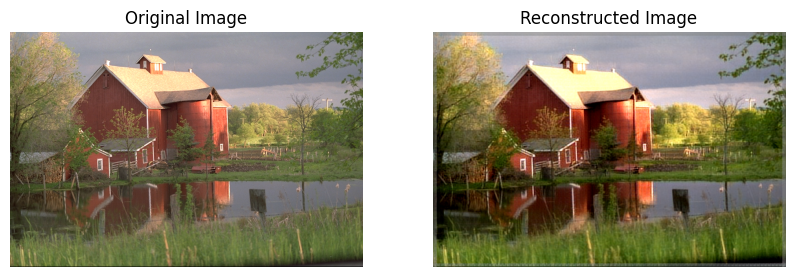

LPIPS Loss: 3.8697999116266146e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


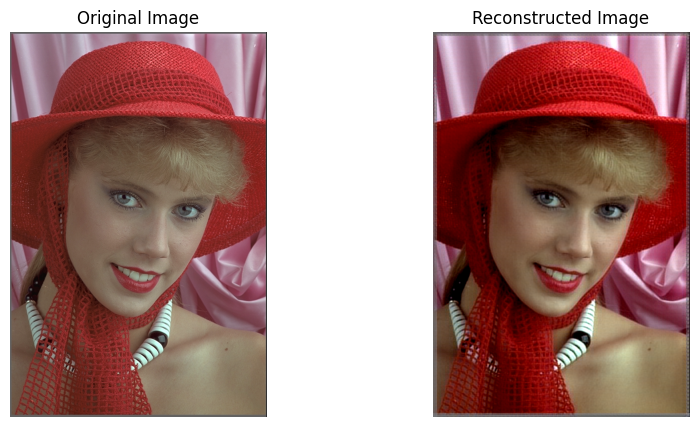

LPIPS Loss: 3.08242961182259e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


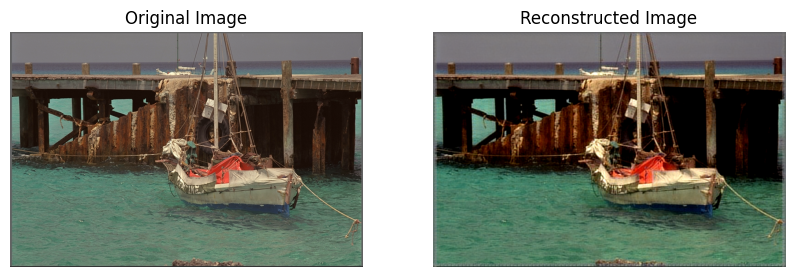

LPIPS Loss: 3.424068563617766e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


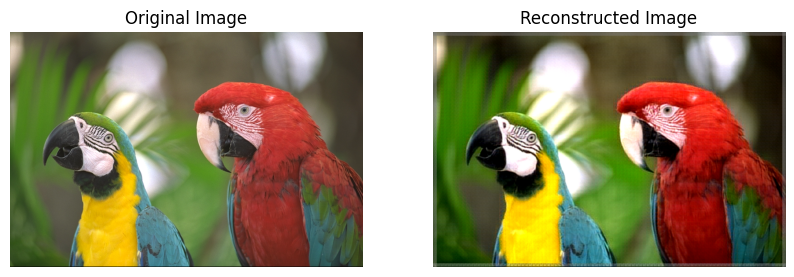

LPIPS Loss: 4.980130324838683e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


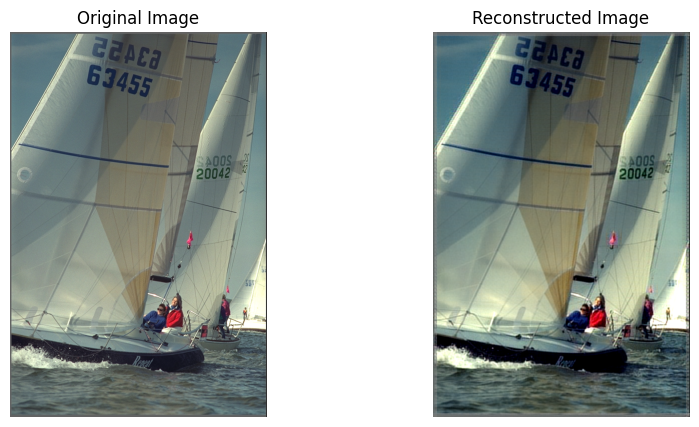

LPIPS Loss: 3.424009992158972e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


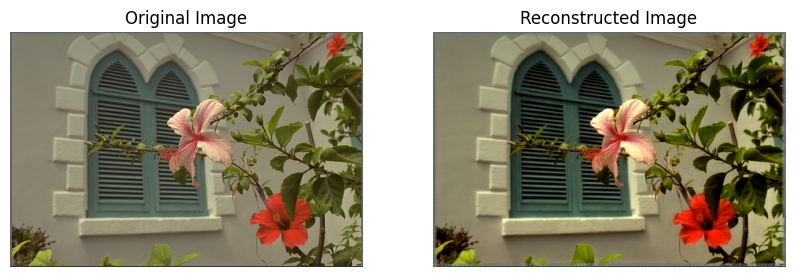

LPIPS Loss: 3.822687722276896e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


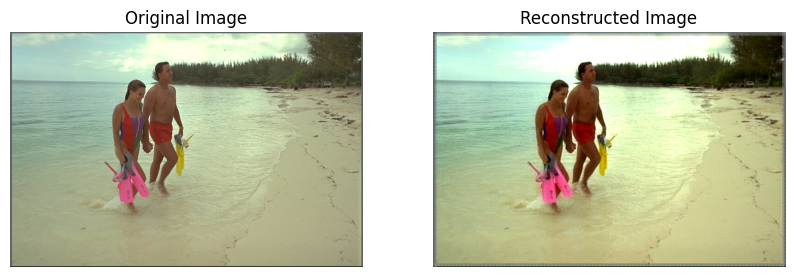

LPIPS Loss: 4.154344060225412e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


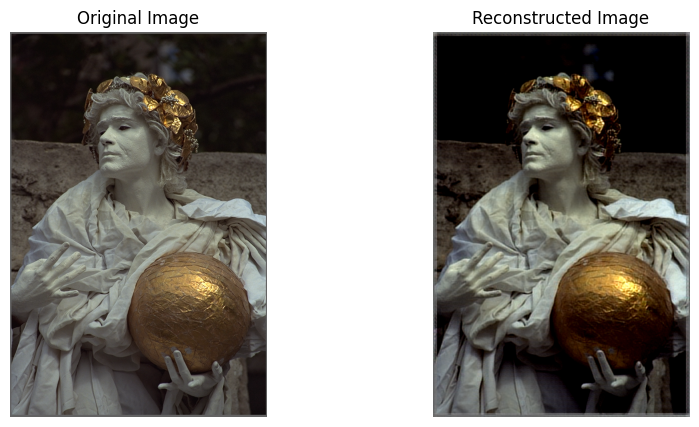

LPIPS Loss: 3.109942554146983e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


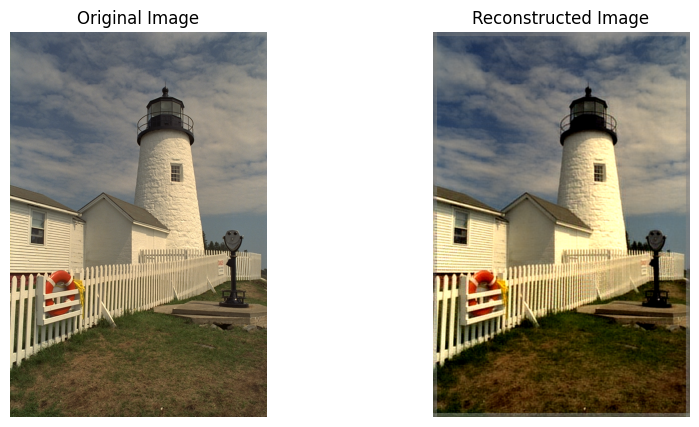

LPIPS Loss: 5.387018609326333e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


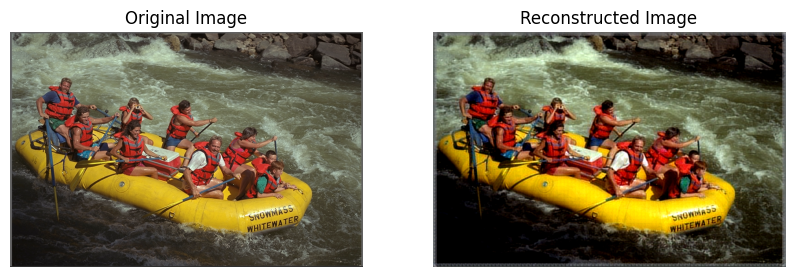

LPIPS Loss: 5.84086483286228e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


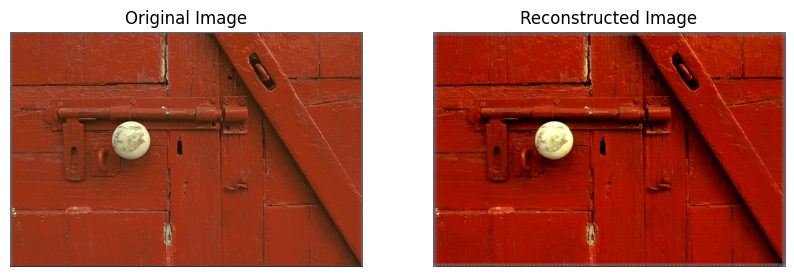

LPIPS Loss: 4.408026143210009e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


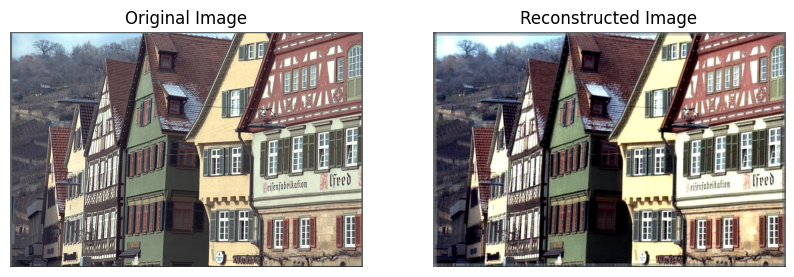

LPIPS Loss: 9.56412113737315e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


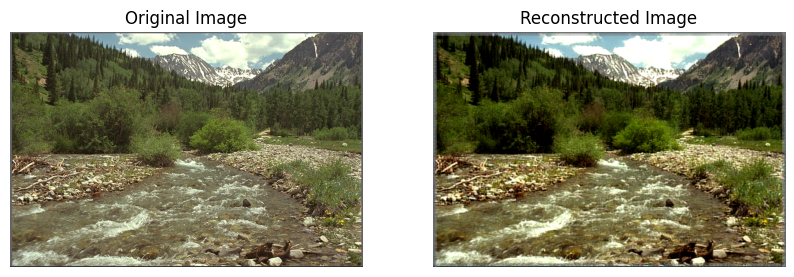

LPIPS Loss: 8.552929648431018e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


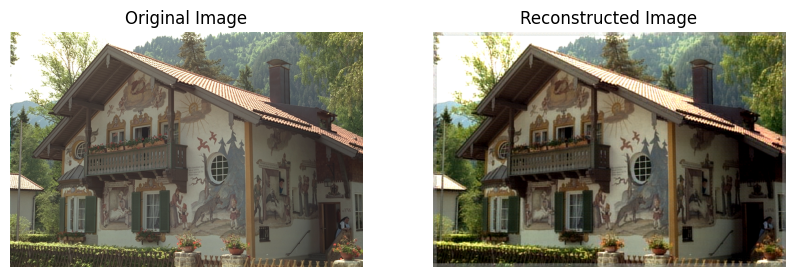

LPIPS Loss: 6.767227750970051e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


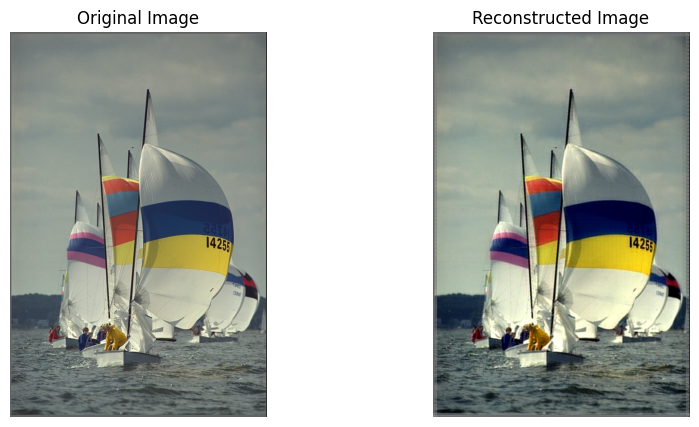

LPIPS Loss: 4.192288179183379e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


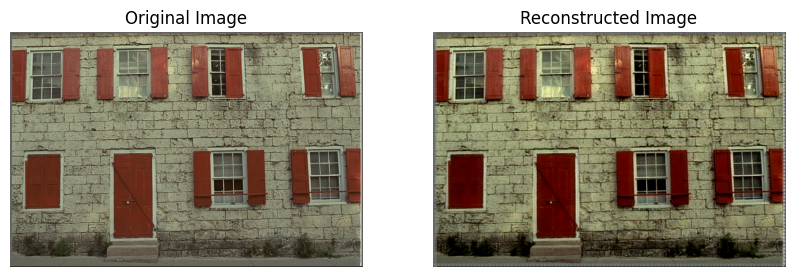

LPIPS Loss: 4.369503221823834e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


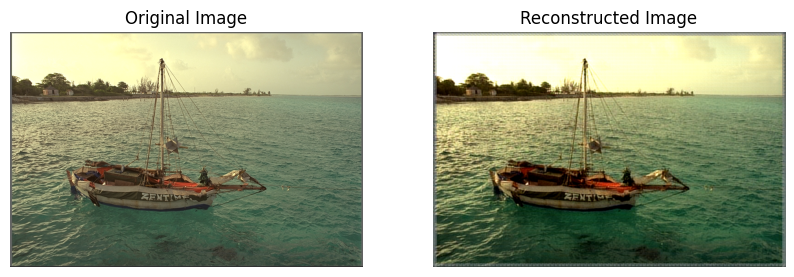

LPIPS Loss: 4.694964809459634e-05
Original image size: 4718592 bytes
Compressed image size: 574560 bytes
Compression ratio: 8.212531328320802


In [21]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms

denormalize = transforms.Normalize((-1.0, -1.0, -1.0), (2.0, 2.0, 2.0))

def denormalize_image(tensor):
    return denormalize(tensor)


def quantize(tensor, num_levels):
    min_val = tensor.min()
    max_val = tensor.max()
    scale = (max_val - min_val) / (num_levels - 1)
    quantized = torch.round((tensor - min_val) / scale)
    return quantized, scale, min_val


def dequantize(quantized, scale, min_val):
    dequantized = quantized * scale + min_val
    return dequantized



def compress_image(image, model, num_levels):


    with torch.no_grad():
        transformed_image = model.conv1(image)


    quantized_image, scale, min_val = quantize(transformed_image, num_levels)


    flat_quantized = quantized_image.flatten().cpu().numpy()
    byte_stream = flat_quantized.tobytes()
    return byte_stream, quantized_image.shape, scale, min_val



def decompress_image(byte_stream, shape, scale, min_val, model):

    flat_quantized = np.frombuffer(byte_stream, dtype=np.float32)
    quantized_image = torch.tensor(flat_quantized).view(shape).to(model.conv1.weight.device)

    dequantized_image = dequantize(quantized_image, scale, min_val)


    with torch.no_grad():
        dequantized_image = model.conv2(dequantized_image)
    return dequantized_image


image_dir = '/content/image-compression/images/colored'


image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]


for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)


    image = Image.open(image_path)


    example_image = transforms.ToTensor()(image).unsqueeze(0)
    example_image = (example_image - 0.5) / 0.5

    #lpips_value = calculate_lpips_loss(convert_tensor_for_lpips(example_image),convert_tensor_for_lpips(reconstructed_image_tensor_resized))
    compressed_byte_stream, shape, scale, min_val = compress_image(example_image, model, num_levels=256)
    reconstructed_image = decompress_image(compressed_byte_stream, shape, scale, min_val, model=model)


    original_image_np = denormalize_image(example_image).squeeze().permute(1, 2, 0).cpu().numpy()
    reconstructed_image_np = denormalize_image(reconstructed_image).squeeze().permute(1, 2, 0).cpu().numpy()

    original_image_np = np.clip(original_image_np, 0, 1)
    reconstructed_image_np = np.clip(reconstructed_image_np, 0, 1)


    original_image_pil = Image.fromarray((original_image_np * 255).astype(np.uint8))
    reconstructed_image_pil = Image.fromarray((reconstructed_image_np * 255).astype(np.uint8))

    original_image_pil.save(f'original_{image_file}')
    reconstructed_image_pil.save(f'reconstructed_{image_file}')

    original_image_tensor = image_to_tensor(original_image_np)
    reconstructed_image_tensor = image_to_tensor(reconstructed_image_np)

    lpips_value = calculate_lpips_loss(convert_tensor_for_lpips(original_image_tensor),convert_tensor_for_lpips(reconstructed_image_tensor))

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_image_np)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Reconstructed Image')
    plt.imshow(reconstructed_image_np)
    plt.axis('off')

    plt.show()


    original_image_size = example_image.nelement() * example_image.element_size()
    compressed_image_size = len(compressed_byte_stream)
    compression_ratio = original_image_size / compressed_image_size
    print(f'LPIPS Loss: {lpips_value}')
    print(f'Original image size: {original_image_size} bytes')
    print(f'Compressed image size: {compressed_image_size} bytes')
    print(f'Compression ratio: {compression_ratio}')
